In [ ]:
pip install face_recognition

     |████████████████████████████████| 100.2MB 42kB/s 
  Created wheel for face-recognition-models: filename=face_recognition_models-0.3.0-py2.py3-none-any.whl size=100566172 sha256=66b82a4e41184478931e2d61763caf9bffe6275041cf8d3795cb35669567e014
  Stored in directory: /root/.cache/pip/wheels/d2/99/18/59c6c8f01e39810415c0e63f5bede7d83dfb0ffc039865465f
Successfully built face-recognition-models


In [ ]:
import face_recognition

In [ ]:
import PIL.Image
import PIL.ImageDraw

In [ ]:

# Load the known images
Rushit = face_recognition.load_image_file("rushit.jpeg")
Hardik = face_recognition.load_image_file("hardik.jpg")
Neel = face_recognition.load_image_file("neel.jpeg")

In [ ]:
# Get the face encoding of each person. This can fail if no one is found in the photo.
rushit_face_encoding = face_recognition.face_encodings(Rushit)[0]
hardik_face_encoding = face_recognition.face_encodings(Hardik)[0]
neel_face_encoding = face_recognition.face_encodings(Neel)[0]


In [ ]:
# Create a list of all known face encodings
known_face_encodings=[
                      rushit_face_encoding,
                      hardik_face_encoding,
                      neel_face_encoding
]

In [ ]:
#Load the image we want to check
unkown_image = face_recognition.load_image_file("unkown_7.jpg")

face_locations= face_recognition.face_locations(unkown_image,number_of_times_to_upsample=2)

#Get face_encoding for any people in the unkown image 
unkown_face_encodings= face_recognition.face_encodings(unkown_image,known_face_locations=face_locations)

In [ ]:
pil_image = PIL.Image.fromarray(unkown_image)


In [ ]:
from PIL import Image, ImageDraw, ImageFont

Found Neel in the photo!
Found Rushit in the photo!
Found Hardik in the photo!


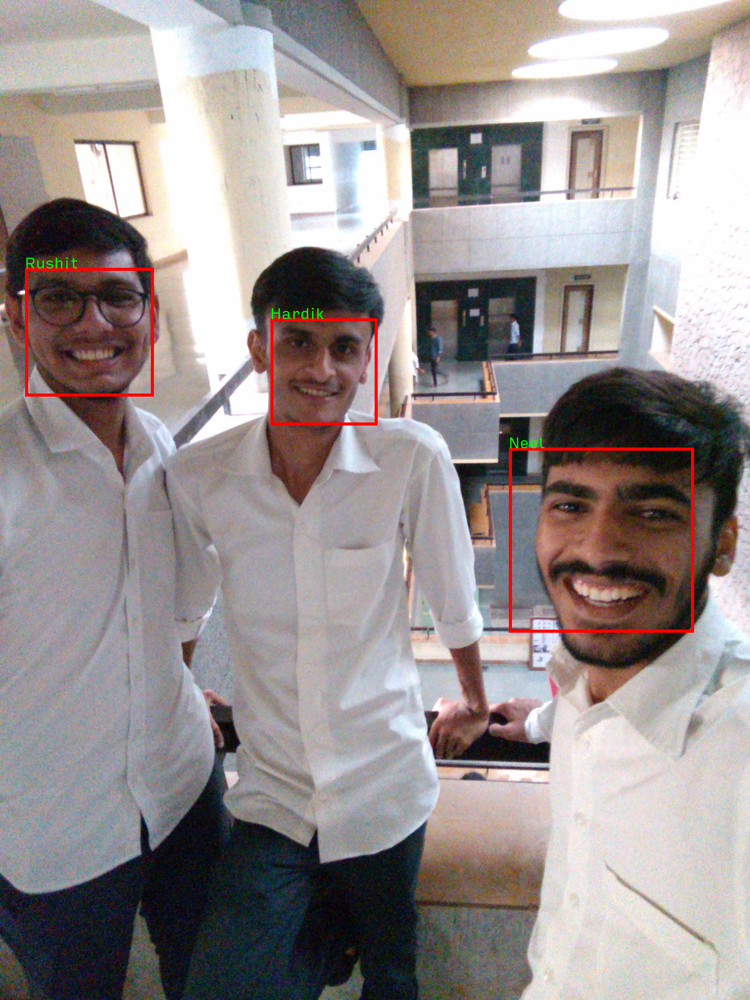

In [ ]:
# There might be more than one people in the photo , so wee need to loop over each face we found
for i in range(0,len(unkown_face_encodings)):

  #Test if this unkown face encoding matches any of these people we know
  results= face_recognition.compare_faces(known_face_encodings,unkown_face_encodings[i],tolerance=0.6)
  name = "Unknown"

  if results[0]:
      name = "Rushit"
  elif results[1]:
      name = "Hardik"
  elif results[2]:
      name = "Neel"

  print(f"Found {name} in the photo!")
  top, right, bottom, left = face_locations[i]
  draw = PIL.ImageDraw.Draw(pil_image)
  draw.rectangle([left, top, right, bottom], outline="red",width=8)
 
  # starting position of the message
 
  color = 'rgb(0, 255, 0)' # green color
  font_path = "InputSans-Regular.ttf"
  font = ImageFont.truetype(font_path,38)
  # draw the message on the background
  draw.text((left,top-34),name, fill=color,font=font)

pil_image
  




In [ ]:
pil_image.save("identified.jpg")